In [1]:
from utils import *
from modeling import *
from plotting import *

%load_ext autoreload
%autoreload 2

############################################
# Setup
############################################

# Fitting Parameter
n_cpu = 3
RUN_FITTING = True
print_progress = True
draw = True
save = False
mask_strip = True
wid_strip, n_strip = 16, 48

dir_name = "./real"
aureole_model = 'multi-power'

In [2]:
# Image Parameter
# patch_Xmin0, patch_Ymin0, patch_Xmax0, patch_Ymax0 = 800, 1800, 1800, 2800  # image coords
patch_Xmin0, patch_Ymin0, patch_Xmax0, patch_Ymax0 = 3100, 1400, 4100, 2400  
patch_Xmin0, patch_Ymin0, patch_Xmax0, patch_Ymax0 = (3000, 1400, 4200, 2600)

image_size = 1000
pixel_scale = 2.5                                # arcsec/pixel
psf_scale = 2.0                                  # arcsec/pixel

In [4]:
# PSF Parameters
beta = 10                                     # moffat beta, in arcsec
fwhm = 2.28 * pixel_scale                     # moffat fwhm, in arcsec

n0 = 3.1                    # estimated true power index
theta_0 = 5.                # radius at which power law is flattened, in arcsec (arbitrary)

n_s = np.array([n0, 2.8, 2.4, 1.8, 1.2, 4])                   # power index
theta_s = np.array([theta_0, 72, 150, 240, 300, 1200])      # transition radius in arcsec

if aureole_model == 'power':
    # Single-power PSF
    frac = 0.3              # fraction of power law component (from fitting stacked PSF)
    params_pow = {"fwhm":fwhm, "beta":beta, "frac":frac, "n":n0, 'theta_0':theta_0}
    psf = PSF_Model(params=params_pow, aureole_model='power')
    
elif aureole_model == 'multi-power':
    # Multi-power PSF
    frac = 0.3  
    params_mpow = {"fwhm":fwhm, "beta":beta, "frac":frac, "n_s":n_s, 'theta_s':theta_s}
    psf = PSF_Model(params=params_mpow, aureole_model='multi-power')

# Build grid of image for drawing
psf.make_grid(image_size, pixel_scale=pixel_scale)

mu: 460.20 , ZP: 27.10 , pix_scale: 2.50


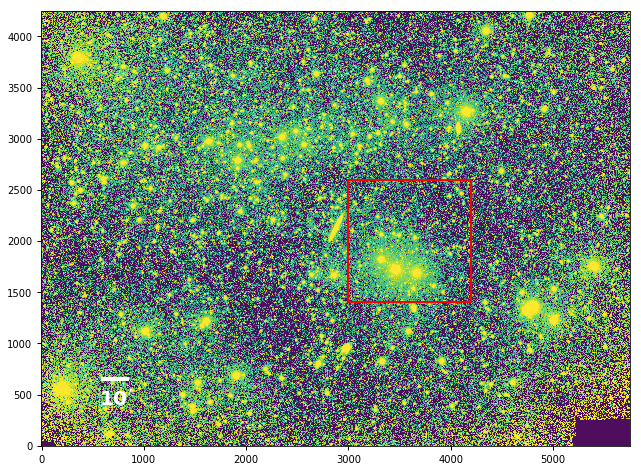

In [5]:
############################################
# Read
############################################
hdu = fits.open("./data/coadd_SloanG_NGC_5907.fits")[0]
data = hdu.data
header = hdu.header

# Backgroundlevel and estimated std
mu, ZP = np.float(hdu.header["BACKVAL"]), np.float(hdu.header["REFZP"])
print("mu: %.2f , ZP: %.2f , pix_scale: %.2f" %(mu, ZP, pixel_scale))

# Crop image
pad = ((patch_Xmax0-patch_Xmin0)-image_size)//2
patch_Xmin, patch_Ymin = patch_Xmin0 + pad, patch_Ymin0 + pad
patch_Xmax, patch_Ymax = patch_Xmax0 - pad, patch_Ymax0 - pad

image_bounds0 = (patch_Xmin0, patch_Ymin0, patch_Xmax0, patch_Ymax0)
patch0, seg_patch0 = crop_image(data, image_bounds0, sky_mean=mu, sky_std=3, draw=True)

# Read measurement for faint stars from catalog
tab_catalog = Table.read("./Measure/NGC5907-G-catalog_PS_X%sY%s.txt"\
                       %(patch_Xmin0,patch_Ymin0), format="ascii")
tab_faint = tab_catalog[(tab_catalog["rmag"]>=15) & (tab_catalog["rmag"]<22)]
tab_faint = crop_catalog(tab_faint, keys=("X_IMAGE_PS", "Y_IMAGE_PS"),
                         bounds=(patch_Xmin,patch_Ymin,patch_Xmax,patch_Ymax))
tab_faint["FLUX_AUTO"] = 10**((tab_faint["GMAG_AUTO"]-ZP)/(-2.5))

# Read measurement for bright stars
R_scale = 10
table_res_Rnorm = Table.read("./Measure/NGC5907-G-norm_%dpix_r15mag_X%dY%d.txt"\
                             %(R_scale, patch_Xmin0, patch_Ymin0), format="ascii")
table_res_Rnorm = crop_catalog(table_res_Rnorm, bounds=image_bounds0)

Threosholds: [27.5 23.5] [  80155.649837   3191053.89604849] [  4.30865394 171.53060282]
# of medium bright (flux:8.4e+04~2.5e+06) stars: 83 
# of very bright (flux>1.7e+07) stars : 3
Crowded fields w/ bright stars > 50, will draw in parallel.



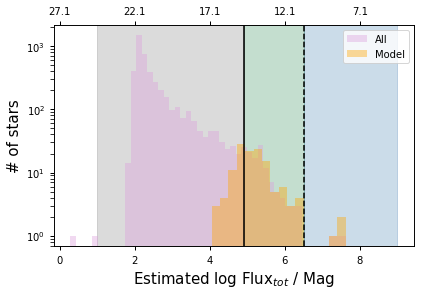

In [6]:
# Star Distribution
############################################
# Positions & Flux of faint stars from SE
ma = tab_faint['FLUX_AUTO'].data.mask
star_pos1 = np.vstack([tab_faint['X_IMAGE_PS'].data[~ma],
                       tab_faint['Y_IMAGE_PS'].data[~ma]]).T - [patch_Xmin, patch_Ymin]
Flux1 = np.array(tab_faint['FLUX_AUTO'].data[~ma])

# Positions & Flux (estimate) of faint stars from measured norm
star_pos2 = np.vstack([table_res_Rnorm['X_IMAGE'],
                       table_res_Rnorm['Y_IMAGE']]).T - [patch_Xmin, patch_Ymin]
# sky_local = np.median(table_res_Rnorm['sky'].data)

# Estimate of brightness I at r_scale (I = Intensity - BKG) and flux
z_norm = table_res_Rnorm['Imean'].data - mu
Flux2 = psf.I2Flux(z_norm, r=R_scale)

# Thresholds
SB_threshold = np.array([27.5,23.5])
Flux_threshold = psf.SB2Flux(SB_threshold, BKG=mu, ZP=ZP, r=R_scale)
z_threshold = psf.Flux2I(Flux_threshold, r=R_scale)
print("Threosholds:", SB_threshold, Flux_threshold, z_threshold)

# Combine 
star_pos = np.vstack([star_pos1, star_pos2])
Flux = np.concatenate([Flux1, Flux2])
stars_all = Stars(star_pos, Flux, Flux_threshold=Flux_threshold)
stars_all.plot_flux_dist(label='All', color='plum')

# Bright stars in model
stars0 = Stars(star_pos2, Flux2, Flux_threshold=Flux_threshold,
               z_norm=z_norm, r_scale=R_scale, BKG=mu)
stars0 = stars0.remove_outsider(image_size, d=[24, 6], verbose=True)
stars0.plot_flux_dist(label='Model', color='orange', ZP=ZP)

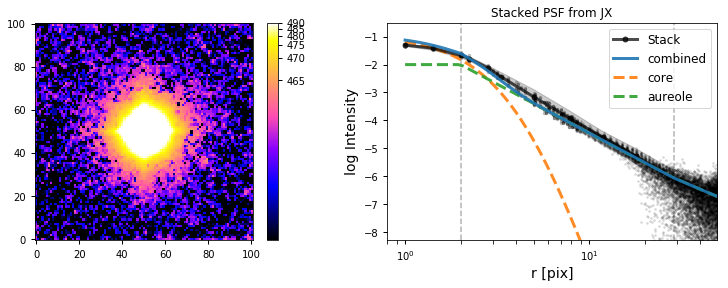

In [12]:
PSF_JX_p = fits.getdata("./median_psf_patch.fits") * 1e5 + mu

fig = plt.figure(figsize=(13,4))
ax1 = plt.subplot(121)
im = ax1.imshow(PSF_JX_p, norm=norm1, vmin=mu); colorbar(im)

ax2 = plt.subplot(122)
r_rbin, z_rbin, logzerr_rbin = cal_profile_1d(abs(PSF_JX_p-mu)/1e6, cen=(50,50), 
                                              ZP=ZP, sky_mean=0, sky_std=1e-6,
                                              dr=1, lw=3, pixel_scale=pixel_scale,
                                              xunit="pix", yunit="Intensity", color="k", label='Stack',
                                              scatter=True, core_undersample=True)
plt.title("Stacked PSF from JX")
psf.plot1D()

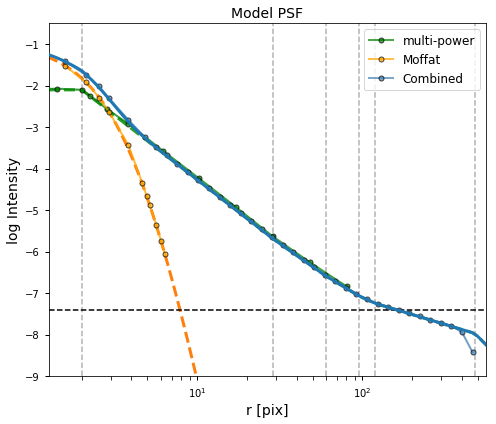

In [7]:
# Generate core and aureole PSF
psf_c = psf.generate_core()
psf_e, psf_size = psf.generate_aureole(contrast=1e6, psf_range=image_size)
star_psf = (1-frac) * psf_c + frac * psf_e

# Galsim 2D model averaged in 1D
Amp_m = psf.Flux2Amp(Flux).max()
sigma = 2
contrast = Amp_m / sigma
psf.plot_model_galsim(psf_c, psf_e, image_size, contrast=contrast)

In [8]:
# Setup Image
############################################
# Make noise image
noise_image = make_noise_image(image_size, sigma)

# Make sky background and dim stars
image_base = make_base_image(image_size, stars_all, psf_base=star_psf, psf_size=64, pad=pad, verbose=True)

# Cutout of data
image0 = patch0.copy()
image = image0[pad:-pad,pad:-pad]

Generate noise background w/ stddev = 2
Generate base image of faint stars (flux < 8e+04).
Total Time: 3.775 s



Detect and deblend source... Mask S/N > 3.0 
Use mask map built from catalog
Mask core regions: r < 36 (36) pix 
Use sky strips crossing very bright stars


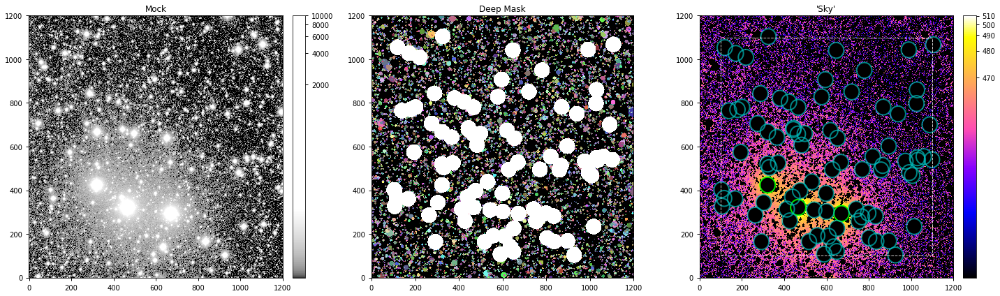

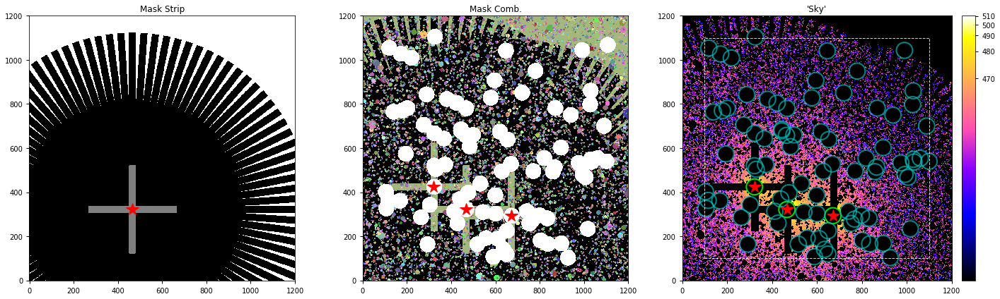

In [9]:
# Make Mask
############################################
mask = Mask(image0, stars0, image_size, pad=pad, mu=mu)

# Core mask
r_core_s = [36, 36]
r_out_s = None

# r_core_s = [24, 12]
# r_out_s = [72, 72]

mask_base = 'Seg_PS_X3000Y1400.fits'
mask.make_mask_map_dual(r_core_s, r_out=r_out_s, mask_base=mask_base,
                        sn_thre=3, draw=True, n_dilation=3)

# Strip + Cross mask
mask.make_mask_strip(wid_strip, n_strip, dist_strip=800, clean=True,draw=True)
stars_b = mask.stars_new

In [10]:
brightest_only = True

if brightest_only:
    stars_vb = Stars(stars_b.star_pos_verybright,
                     stars_b.Flux_verybright,
                     Flux_threshold=stars_b.Flux_threshold,
                     z_norm=stars_b.z_norm_verybright, BKG=stars_b.BKG, r_scale=R_scale)
    stars = stars_vb
else:
    stars = stars_b
    
z_norm_stars = stars.z_norm.copy()
stars_tri = stars.copy()


Total Time: 0.400s


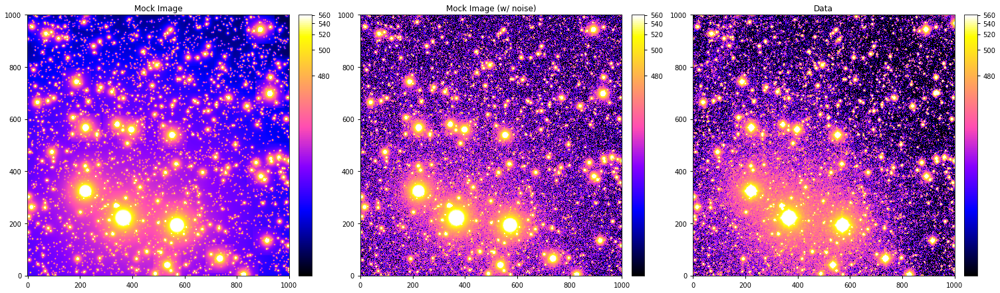

In [11]:
## Generate Image Test
############################################
start = time.time()
image_tri0 = generate_image_by_znorm(psf, stars_b, psf_scale=pixel_scale, parallel=False, draw_real=True)
image_tri0 = image_tri0 + image_base + mu
end = time.time()
print("\nTotal Time: %.3fs"%(end-start))
    
# Draw
if draw:
    fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(21,7))
    im = ax1.imshow(image_tri0, vmin=mu, vmax=mu+100, norm=norm1, cmap="gnuplot2")
    ax1.set_title("Mock Image"); colorbar(im)
    im = ax2.imshow(image_tri0 + noise_image, vmin=mu, vmax=mu+100, norm=norm1, cmap="gnuplot2")    
    ax2.set_title("Mock Image (w/ noise)"); colorbar(im)
    im = ax3.imshow(image, vmin=mu, vmax=mu+100, norm=norm1, cmap="gnuplot2")
    ax3.set_title("Data"); colorbar(im)
    plt.tight_layout()  

In [19]:
%%timeit
image_tri0 = generate_image_by_znorm(psf, stars, psf_range=[320,640],
                                     psf_scale=pixel_scale, parallel=False, draw_real=True)

173 ms ± 26.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [80]:
%%timeit
psf.update({'n_s':[3.3, 2.8], 'theta_s':[theta_0, 60]})
image_tri0 = generate_image_by_znorm(psf, stars, psf_range=[120,300], brightest_only=False,
                                        psf_scale=pixel_scale, parallel=True, draw_real=False)

157 ms ± 1.21 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


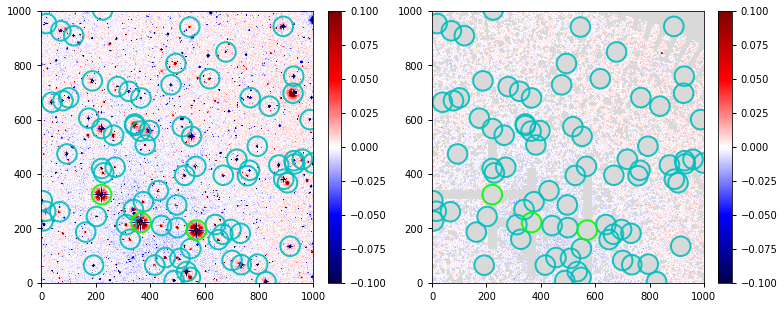

In [12]:
img_diff = (image_tri0-image)/image
plt.figure(figsize=(11,5))
ax1=plt.subplot(121)
im = plt.imshow(img_diff, vmin=-0.1, vmax=0.1, origin="lower", cmap="seismic")
colorbar(im)

ax2=plt.subplot(122)
img_diff[mask.mask_comb] = np.nan
im = plt.imshow(img_diff, vmin=-0.1, vmax=0.1, origin="lower", cmap="seismic")
colorbar(im)

aper1 = CircularAperture(stars_b.star_pos_medbright, r=36)
aper2 = CircularAperture(stars_b.star_pos_verybright, r=36)
for ax in [ax1,ax2]:
    aper1.plot(color='c',lw=2,alpha=0.9,axes=ax)
    aper2.plot(color='lime',lw=2,alpha=0.9,axes=ax)

plt.tight_layout()

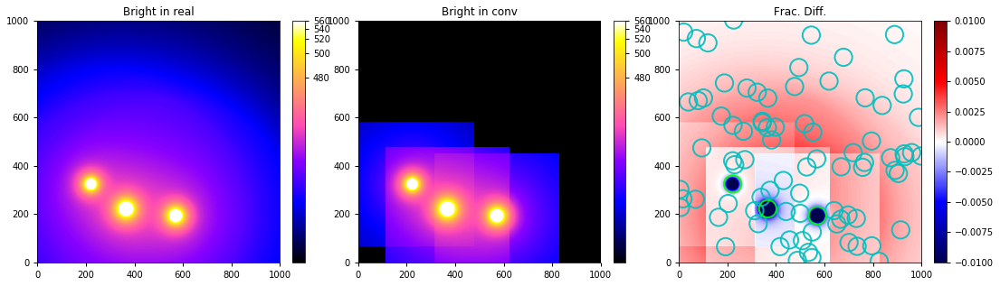

In [13]:
# Difference between real vs conv
psf.update({'n_s':n_s})

img1 = generate_image_by_znorm(psf, stars, psf_range=[320,640], psf_scale=pixel_scale, draw_real=True)
img2 = generate_image_by_znorm(psf, stars, psf_range=[320,640], psf_scale=pixel_scale, draw_real=False)

fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(18,6))
im = ax1.imshow(img1+mu, vmin=mu, vmax=mu+100, norm=norm1, cmap="gnuplot2")
ax1.set_title("Bright in real"); colorbar(im)
im = ax2.imshow(img2+mu, vmin=mu, vmax=mu+100, norm=norm1, cmap="gnuplot2")    
ax2.set_title("Bright in conv"); colorbar(im)
im = ax3.imshow((img1-img2)/mu, vmin=-0.01, vmax=0.01, cmap="seismic")
ax3.set_title("Frac. Diff."); colorbar(im)

aper1.plot(color='c',lw=2,alpha=0.9,axes=ax3)
aper2.plot(color='lime',lw=2,alpha=0.9,axes=ax3)

In [14]:
# Estimates
############################################
if mask_strip is True:
    mask_fit = mask.mask_comb
else:
    mask_fit = mask.mask_deep
    
X = np.array([psf.xx,psf.yy])
Y = image[~mask_fit].copy().ravel()

# Estimated mu and sigma used as prior
Y_clip = sigma_clip(image[~mask.mask_deep], sigma=3, maxiters=10)
mu_patch, std_patch = np.mean(Y_clip), np.std(Y_clip)
print("Estimate of Background: (%.3f, %.3f)"%(mu_patch, std_patch))

Estimate of Background: (461.378, 2.732)


Fitting Annulus

In [89]:
# Priors and Likelihood Models for Fitting
############################################
labels = [r'$n0$', r'$n1$', r'$\theta_1$', r'$\mu$', r'$\log\,\sigma$']
ndim = len(labels)

# Make Priors
prior_tf_2p = set_prior(n_est=3.5, mu_est=mu_patch, std_est=std_patch,
                        n_min=2., theta_in=30, theta_out=180, method='2p')
def loglike_2p(v):
    _n_s = v[:2]
    _theta_s = [theta_0, 10**v[2]]
    _mu, _sigma = v[-2], 10**v[-1]
    
    psf.update({'n_s':_n_s, 'theta_s':_theta_s})
     
    # I varies with sky background
    stars_tri.z_norm = z_norm_stars + (stars.BKG - _mu)
    
    image_tri = generate_image_by_znorm(psf, stars_tri, psf_range=[120,320], brightest_only=False,
                                        psf_scale=pixel_scale, parallel=True, draw_real=False)
    image_tri = image_tri + image_base + _mu
    
    ypred = image_tri[~mask_fit].ravel()
    residsq = (ypred - Y)**2 / _sigma**2
    loglike = -0.5 * np.sum(residsq + np.log(2 * np.pi * _sigma**2))
    
    if not np.isfinite(loglike):
        loglike = -1e100
        
    return loglike

In [90]:
# Run & Plot
############################################
ds_2p = DynamicNestedSampler(loglike_2p, prior_tf_2p, ndim)
ds_2p.run_fitting(nlive_init=40, nlive_batch=20, maxbatch=2)


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 5


iter: 1740 | batch: 2 | bound: 54 | nc: 4 | ncall: 6011 | eff(%): 28.947 | loglstar: -718307.585 < -718304.365 < -718305.532 | logz: -718331.496 +/-  1.008 | stop:  7.206                            


Finish Fitting! Total time elapsed: 959 s

Pool Closed.


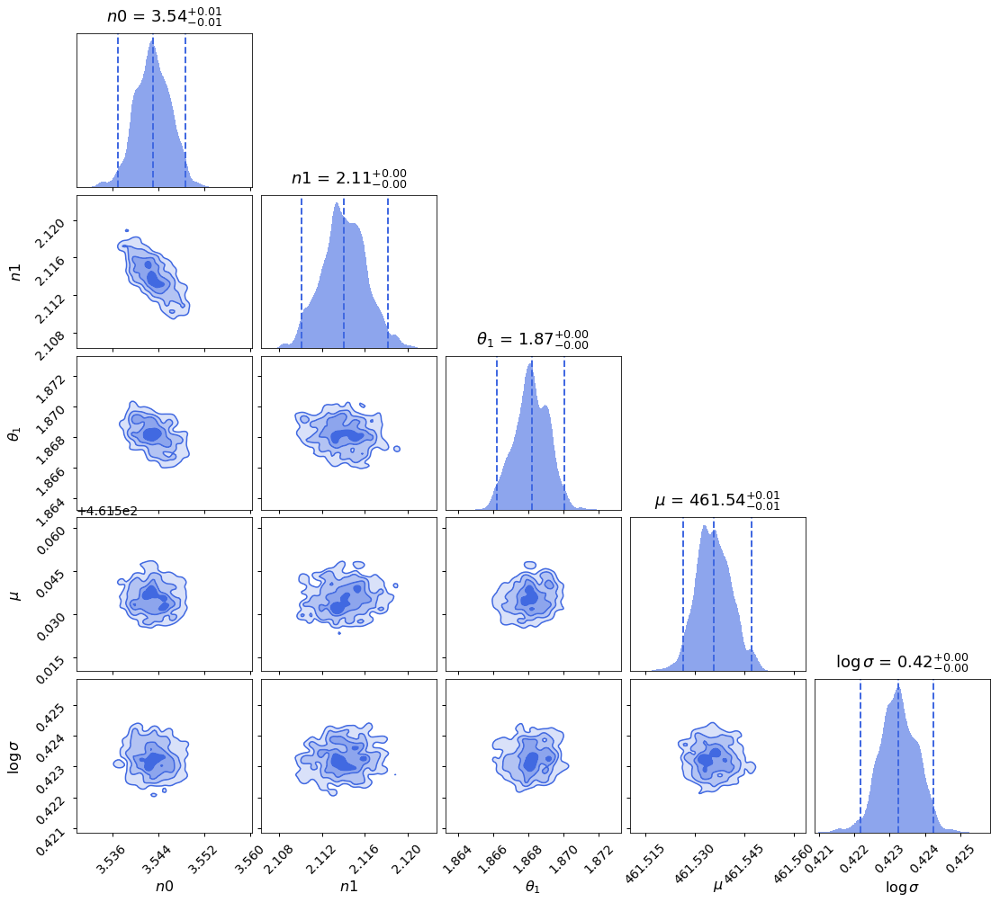

In [91]:
ds_2p.cornerplot(labels=labels, figsize=(16, 14))

Fitting (mean) :  [3.54300e+00 2.11400e+00 1.86800e+00 4.61536e+02 4.23000e-01]
Fitting (median) :  [3.54300e+00 2.11400e+00 1.86800e+00 4.61536e+02 4.23000e-01]


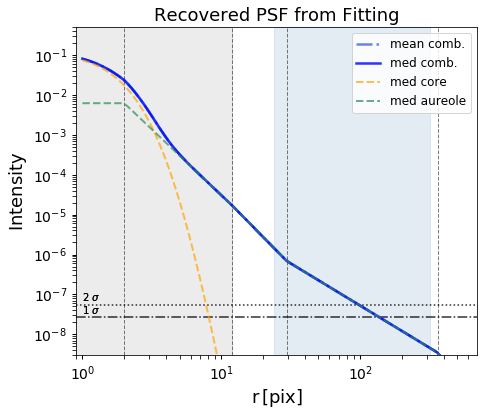

In [93]:
plot_fit_PSF(ds_2p.results, psf, n_bootstrap=1000, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 461.54 +/- 2.65
Reduced Chi^2: 0.98612


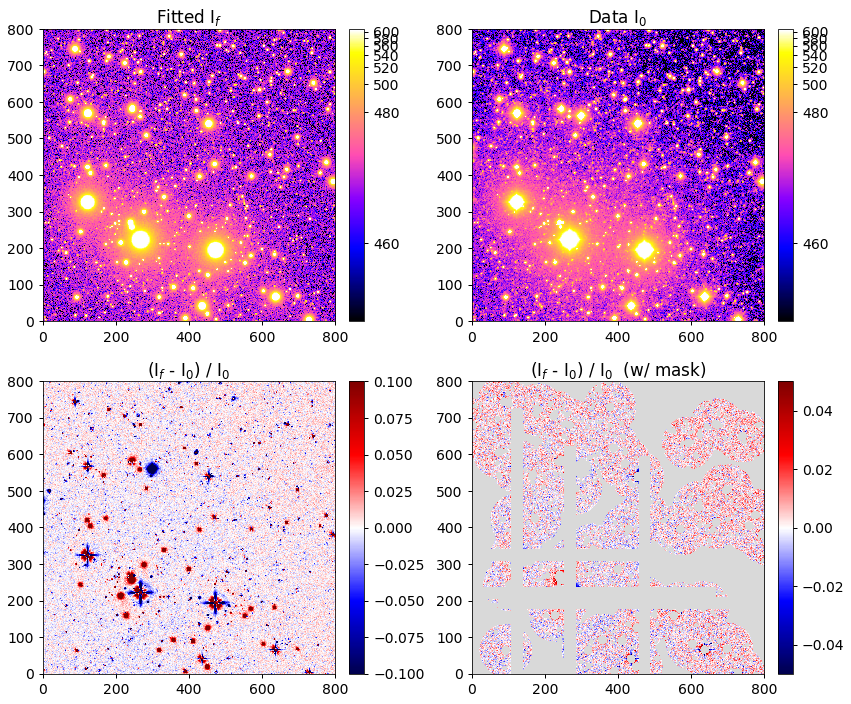

In [94]:
image_fit, noise_fit, pmed = generate_image_fit(ds_2p.results, psf, stars0, image_base)
cal_reduced_chi2(image_fit[~mask_fit].ravel(), Y, sigma=10**pmed[-1], n_param=3)
draw_comparison_fit_data(image_fit, image, noise_fit, mask_fit, vmin=mu-1)

### Multi-Power Law

In [40]:
# Priors and Likelihood Models for Fitting
############################################
labels = [r'$n0$', r'$n1$', r'$\theta_1$', r'$\mu$', r'$\log\,\sigma$']
ndim = len(labels)

# Make Priors
prior_tf_2p = set_prior(n_est=3.2, mu_est=mu_patch, std_est=3,
                        n_min=0.5, theta_in=100, theta_out=600, method='2p')

def loglike_2p(v):
    _n_s = np.append(v[:2], 4)
    _theta_s = np.append([theta_0, 10**v[2]],900)
    _mu, _sigma = v[-2], 10**v[-1]
    
    psf.update({'n_s':_n_s, 'theta_s':_theta_s})
     
    # I varies with sky background
    stars_tri.z_norm = z_norm_stars + (stars.BKG - _mu)
    
    image_tri = generate_image_by_znorm(psf, stars_tri, psf_range=[320,640], brightest_only=True,
                                        psf_scale=pixel_scale, parallel=False, draw_real=True)
    image_tri = image_tri + image_base + _mu
    
    ypred = image_tri[~mask_fit].ravel()
    residsq = (ypred - Y)**2 / _sigma**2
    loglike = -0.5 * np.sum(residsq + math.log(2 * np.pi * _sigma**2))
    
    if not np.isfinite(loglike):
        loglike = -1e100
        
    return loglike

def loglike_2pn(v):
    _n_s = np.append(v[:2], 4)
    _theta_s = np.append([theta_0, 10**v[2]],900)
    _mu, _sigma = v[-2], 10**v[-1]
    
    psf.update({'n_s':_n_s, 'theta_s':_theta_s})
     
    # I varies with sky background
    stars_tri.z_norm = z_norm_stars + (stars.BKG - _mu)
    
    image_tri = generate_image_by_znorm(psf, stars_tri, psf_range=[320,640], brightest_only=True,
                                        psf_scale=pixel_scale, parallel=False, draw_real=True)
    image_tri = image_tri + image_base + _mu
    
    ypred = image_tri[~mask_fit].ravel()
    
    Sigma = np.sqrt(Y/0.37+_sigma**2)
    
    residsq = (ypred - Y)**2 / Sigma**2
    
    loglike = -0.5 * np.sum(residsq + np.log(2 * np.pi * Sigma**2))
    
    if not np.isfinite(loglike):
        loglike = -1e100
        
    return loglike

In [18]:
# Run & Plot
############################################
ds_2p = DynamicNestedSampler(loglike_2p, prior_tf_2p, ndim)
ds_2p.run_fitting(nlive_init=50, nlive_batch=25, maxbatch=2)


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 5


iter: 2370 | batch: 2 | bound: 69 | nc: 2 | ncall: 6899 | eff(%): 34.353 | loglstar: -696176.646 < -696171.726 < -696173.287 | logz: -696211.665 +/-  1.215 | stop:  6.160                            


Finish Fitting! Total time elapsed: 1.06e+03 s

Pool Closed.


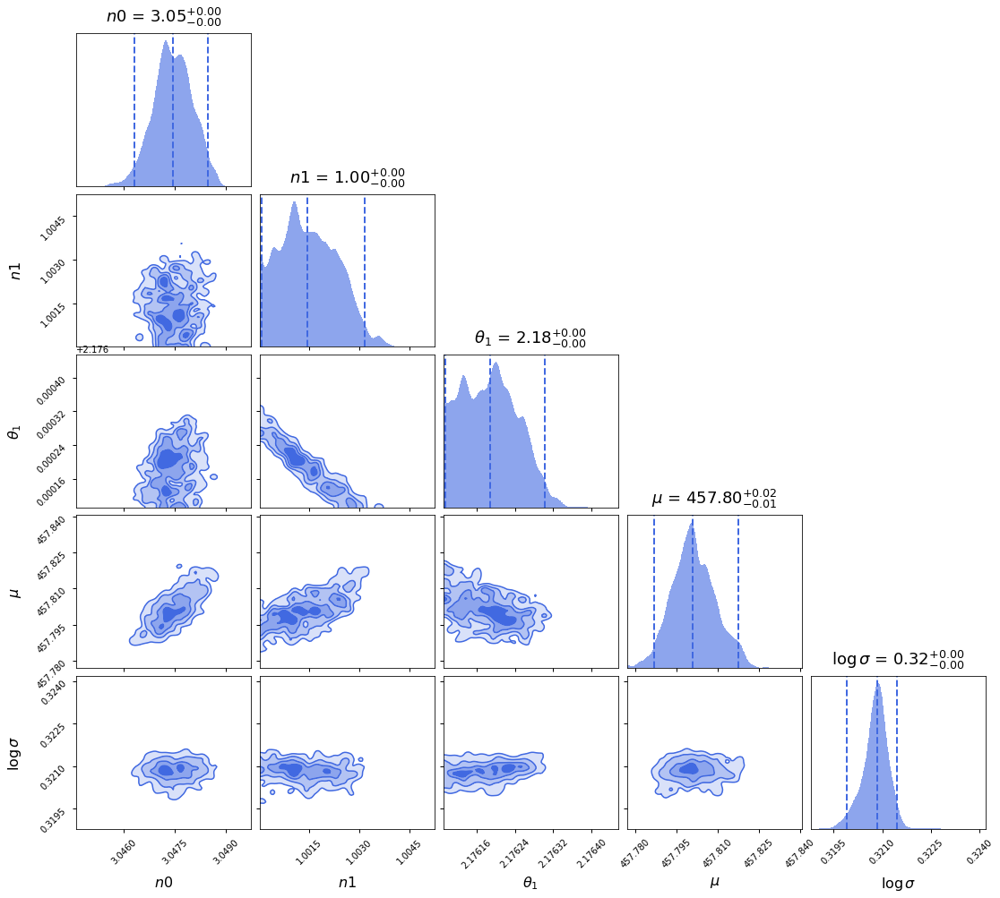

In [19]:
ds_2p.cornerplot(labels=labels, figsize=(16, 14))

Fitting (mean) :  [3.04700e+00 1.00100e+00 2.17600e+00 4.57801e+02 3.21000e-01]
Fitting (median) :  [3.04700e+00 1.00100e+00 2.17600e+00 4.57801e+02 3.21000e-01]


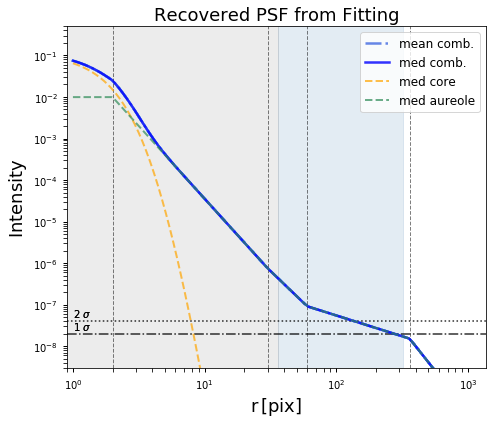

In [20]:
plot_fit_PSF(ds_2p.results, psf, n_bootstrap=1000, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 457.80 +/- 2.09
Reduced Chi^2: 1.08394


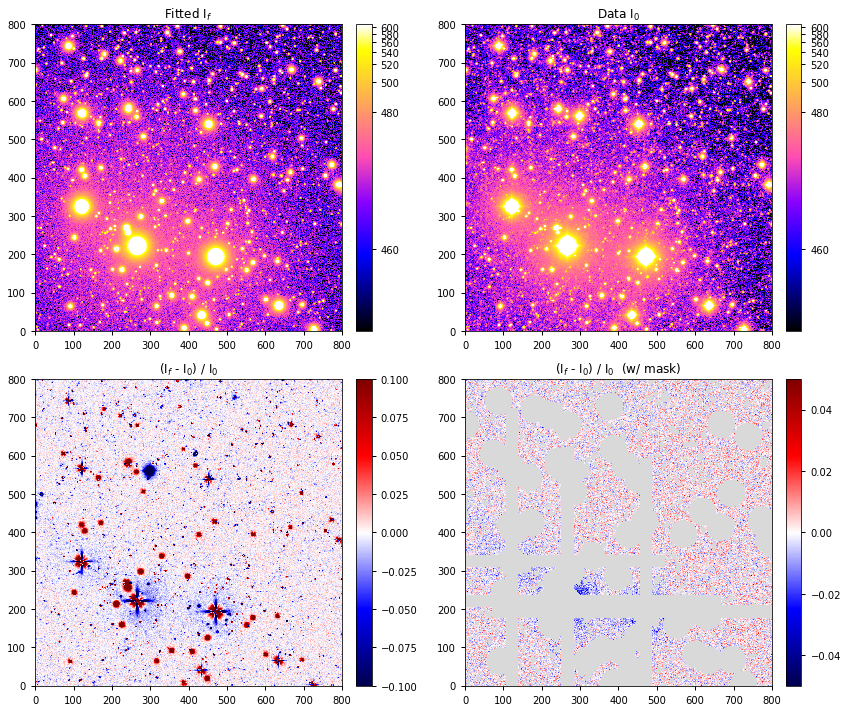

In [23]:
image_fit, noise_fit, pmed = generate_image_fit(ds_2p.results, psf, stars0, image_base)
cal_reduced_chi2((image_fit[~mask_fit]+2).ravel(), Y, sigma=10**pmed[-1], n_param=5)
draw_comparison_fit_data(image_fit+2, image, noise_fit, mask_fit, vmin=mu-1)

In [31]:
# Run & Plot
############################################
ds_2p = DynamicNestedSampler(loglike_2p, prior_tf_2p, ndim)
ds_2p.run_fitting(nlive_init=60, nlive_batch=20, maxbatch=2)


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 5


iter: 2055 | batch: 2 | bound: 69 | nc: 2 | ncall: 7870 | eff(%): 26.112 | loglstar: -670280.329 < -670276.379 < -670277.580 | logz: -670304.351 +/-  0.928 | stop:  5.975                            


Finish Fitting! Total time elapsed: 1.25e+03 s

Pool Closed.


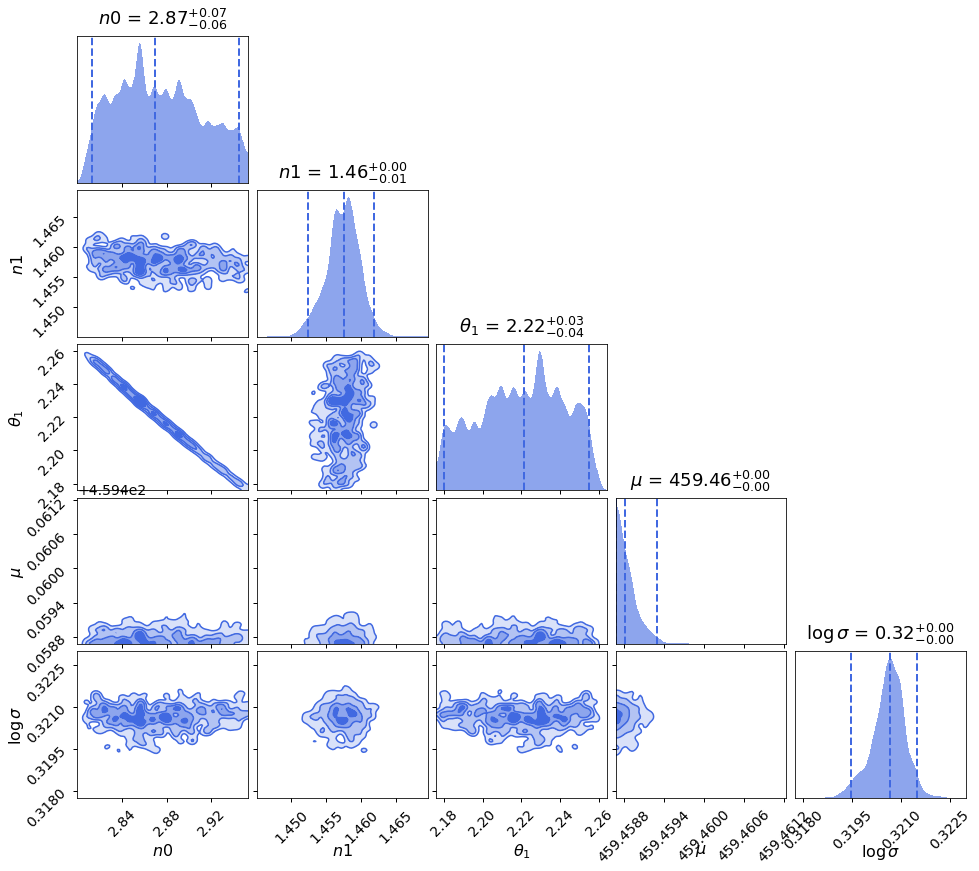

In [32]:
ds_2p.cornerplot(labels=labels, figsize=(16, 14))

Fitting (mean) :  [2.87400e+00 1.45700e+00 2.22000e+00 4.59459e+02 3.21000e-01]
Fitting (median) :  [2.87000e+00 1.45800e+00 2.22100e+00 4.59459e+02 3.21000e-01]


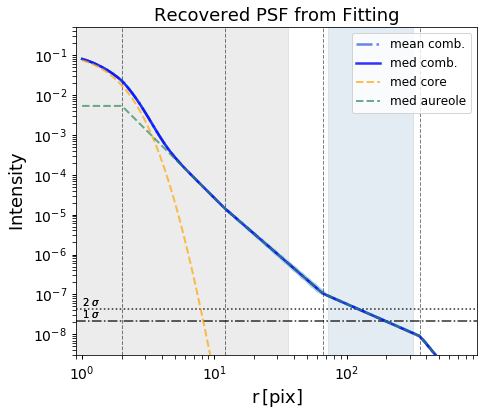

In [34]:
plot_fit_PSF(ds_2p.results, psf, n_bootstrap=1000, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 459.46 +/- 2.09
Reduced Chi^2: 0.95893


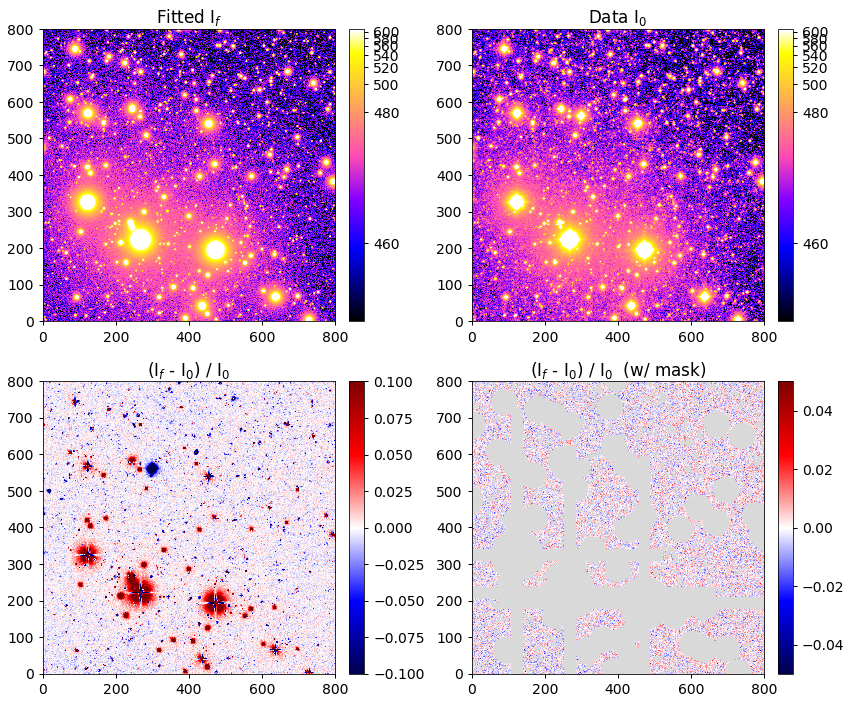

In [43]:
image_fit, noise_fit, pmed = generate_image_fit(ds_2p.results, psf, stars0, image_base)
cal_reduced_chi2(image_fit[~mask_fit].ravel(), Y, sigma=10**pmed[-1], n_param=3)
draw_comparison_fit_data(image_fit, image, noise_fit, mask_fit, vmin=mu-1)

In [16]:
# Priors and Likelihood Models for Fitting
############################################
labels = [r'$n0$', r'$n1$', r'$n2$', r'$\theta_1$', r'$\theta_2$', r'$\mu$', r'$\log\,\sigma$']
ndim = len(labels)

# Make Priors
prior_tf_3p = set_prior(n_est=3.1, mu_est=mu_patch, std_est=std_patch,
                        n_min=0.8, theta_in=60, theta_out=600, method='3p')

def loglike_3p(v):
    _n_s = np.append(v[:3], 4)
    _theta_s = np.append([theta_0, 10**v[3], 10**v[4]], 1200)
    _mu, _sigma = v[-2], 10**v[-1]
    
    psf.update({'n_s':_n_s, 'theta_s':_theta_s})
     
    # I varies with sky background
    stars_tri.z_norm = z_norm_stars + (stars.BKG - _mu)
    
    image_tri = generate_image_by_znorm(psf, stars_tri, psf_range=[320,640], brightest_only=True,
                                        psf_scale=pixel_scale, parallel=False, draw_real=True)
    image_tri = image_tri + image_base + _mu
    
    ypred = image_tri[~mask_fit].ravel()
    residsq = (ypred - Y)**2 / _sigma**2
    loglike = -0.5 * np.sum(residsq + np.log(2 * np.pi * _sigma**2))
    
    if not np.isfinite(loglike):
        loglike = -1e100
        
    return loglike

def loglike_3pn(v):
    _n_s = np.append(v[:3], 4)
    _theta_s = np.append([theta_0, 10**v[3], 10**v[4]], 1200)
    _mu, _sigma = v[-2], 10**v[-1]
    
    psf.update({'n_s':_n_s, 'theta_s':_theta_s})
     
    # I varies with sky background
    stars_tri.z_norm = z_norm_stars + (stars.BKG - _mu)
    
    image_tri = generate_image_by_znorm(psf, stars_tri, psf_range=[320,640], brightest_only=True,
                                        psf_scale=pixel_scale, parallel=False, draw_real=True)
    image_tri = image_tri + image_base + _mu
    
    ypred = image_tri[~mask_fit].ravel()
    
    Sigma = np.sqrt(Y/0.37 + _sigma**2)
    
    residsq = (ypred - Y)**2 / Sigma**2
    
    loglike = -0.5 * np.sum(residsq + np.log(2 * np.pi * Sigma**2))
    
    if not np.isfinite(loglike):
        loglike = -1e100
        
    return loglike

Possion Noise ($\sqrt{S / G}$) + Guassian Noise: $\sigma$=3


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 7


iter: 1444 | batch: 2 | bound: 49 | nc: 6 | ncall: 6763 | eff(%): 21.351 | loglstar: -1157045.665 <   -inf < -1157043.970 | logz:   -inf +/-  0.612 | stop:  5.983                                    



Finish Fitting! Total time elapsed: 1.15e+03 s

Pool Closed.


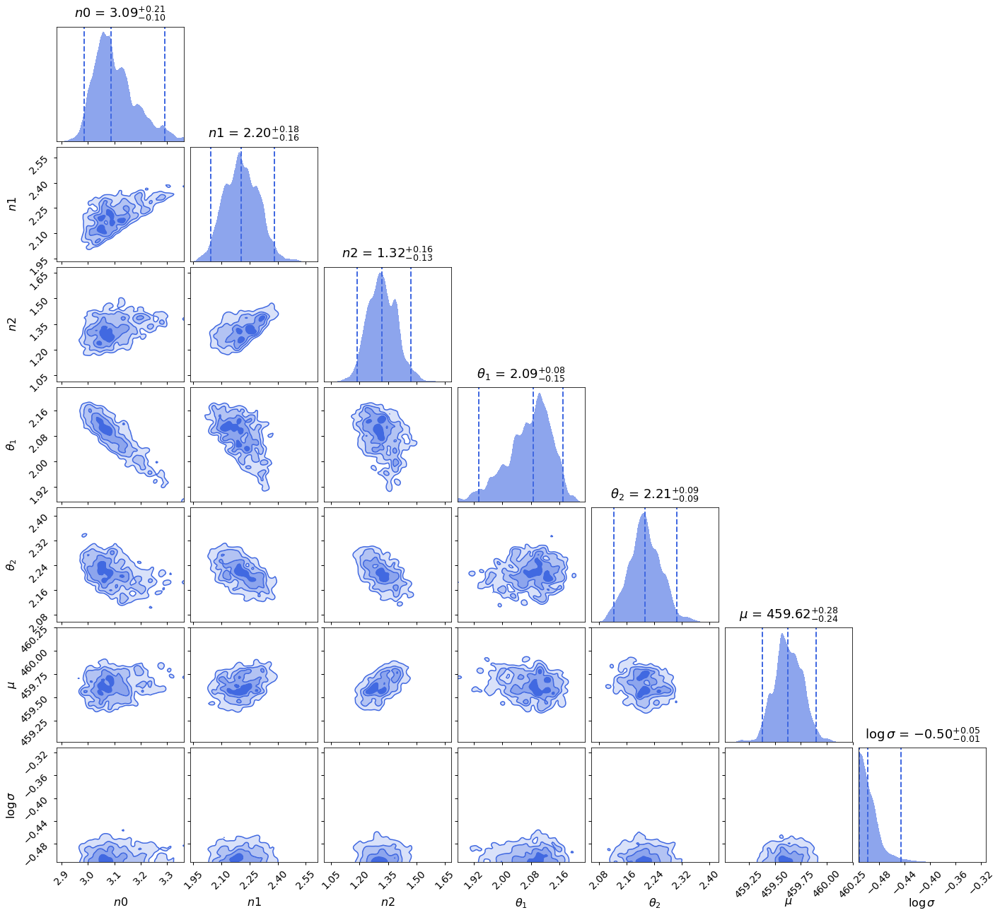

In [104]:
# Run & Plot
############################################
ds_3p = DynamicNestedSampler(loglike_3pn, prior_tf_3p, ndim)
ds_3p.run_fitting(nlive_init=70, nlive_batch=15, maxbatch=2)

ds_3p.cornerplot(labels=labels, figsize=(20, 18))

In [111]:
save_nested_fitting_result(ds_3p.results, filename='./real/NGC5907-G-fit_best_X%dY%d_mask48pix_3PN.res'%(patch_Xmin0, patch_Ymin0))
ds_3p_res = open_nested_fitting_result('./real/NGC5907-G-fit_best_X%dY%d_mask48pix_3PN.res'%(patch_Xmin0, patch_Ymin0))

Fitting (mean) :  [  3.103   2.208   1.32    2.076   2.214 459.631  -0.493]
Fitting (median) :  [  3.088   2.204   1.316   2.086   2.212 459.626  -0.498]


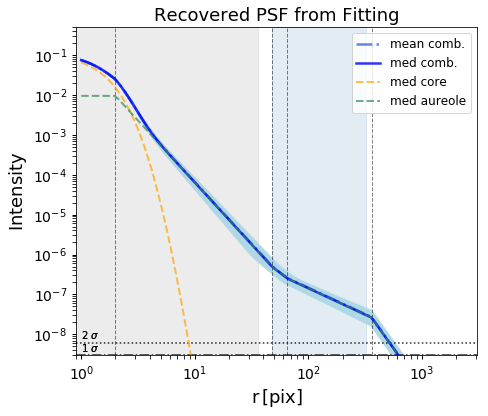

In [112]:
plot_fit_PSF(ds_3p_res, psf, n_bootstrap=1000, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 459.62 +/- 0.32
Reduced Chi^2: 0.00355


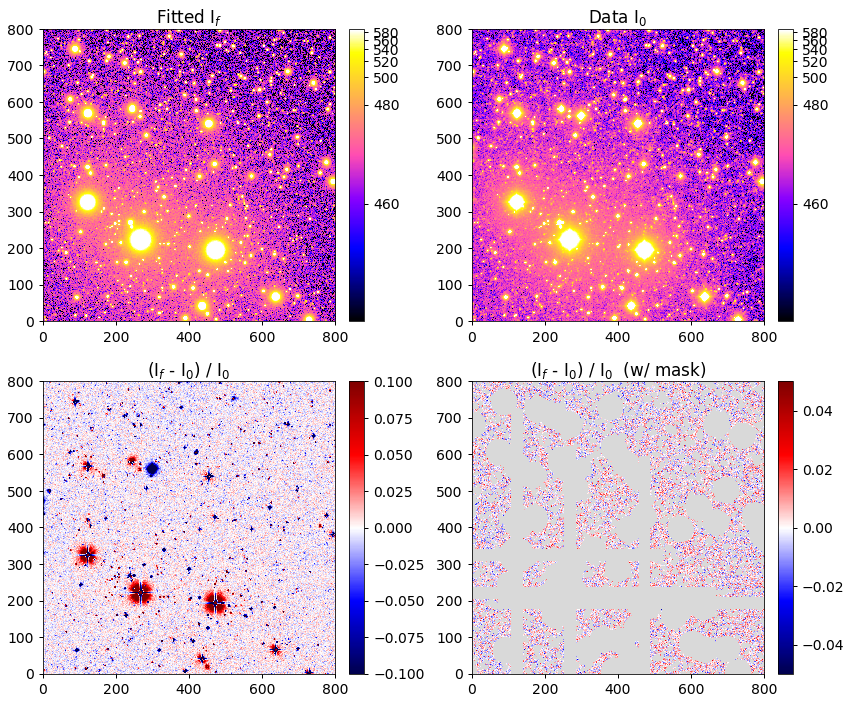

In [114]:
image_fit, noise_fit, pmed = generate_image_fit(ds_3p_res, psf, stars0, image_base)
cal_reduced_chi2(image_fit[~mask_fit].ravel(), Y, pmed, sky_only=False, n_param=7)
draw_comparison_fit_data(image_fit, image, noise_fit*10, mask_fit, vmin=458, vmax=590)

Guassian Noise: $\sigma$ = 3


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 7


iter: 2650 | batch: 2 | bound: 110 | nc: 2 | ncall: 13145 | eff(%): 20.160 | loglstar: -980566.389 < -980562.582 < -980564.084 | logz: -980595.164 +/-  0.928 | stop:  6.284                          



Finish Fitting! Total time elapsed: 3.57e+03 s

Pool Closed.


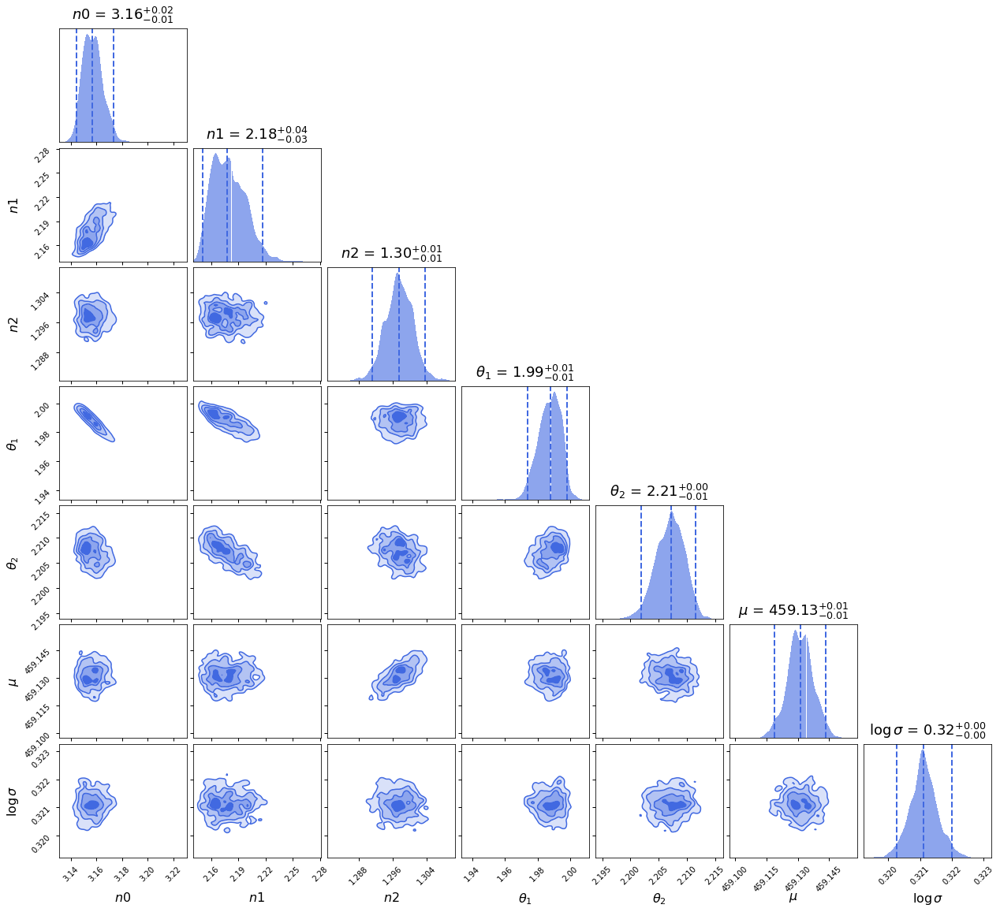

In [17]:
# Run & Plot
############################################
ds_3p = DynamicNestedSampler(loglike_3p, prior_tf_3p, ndim)
ds_3p.run_fitting(nlive_init=70, nlive_batch=15, maxbatch=2)

ds_3p.cornerplot(labels=labels, figsize=(18, 16))

In [17]:
save_nested_fitting_result(ds_3p.results, filename='./real/NGC5907-G-fit_best_X%dY%d_mask48pix_3PS.res'%(patch_Xmin0, patch_Ymin0))
ds_3p_res = open_nested_fitting_result('./real/NGC5907-G-fit_best_X%dY%d_mask48pix_3PS.res'%(patch_Xmin0, patch_Ymin0))

Fitting (mean) :  [3.15700e+00 2.17900e+00 1.29800e+00 1.98700e+00 2.20700e+00 4.59131e+02
 3.21000e-01]
Fitting (median) :  [3.15700e+00 2.17700e+00 1.29800e+00 1.98800e+00 2.20700e+00 4.59131e+02
 3.21000e-01]


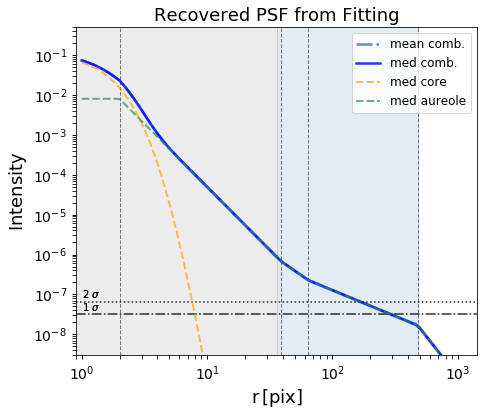

In [20]:
plot_fit_PSF(ds_3p.results, psf, n_bootstrap=1000, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 459.13 +/- 2.09
Reduced Chi^2: 1.06634


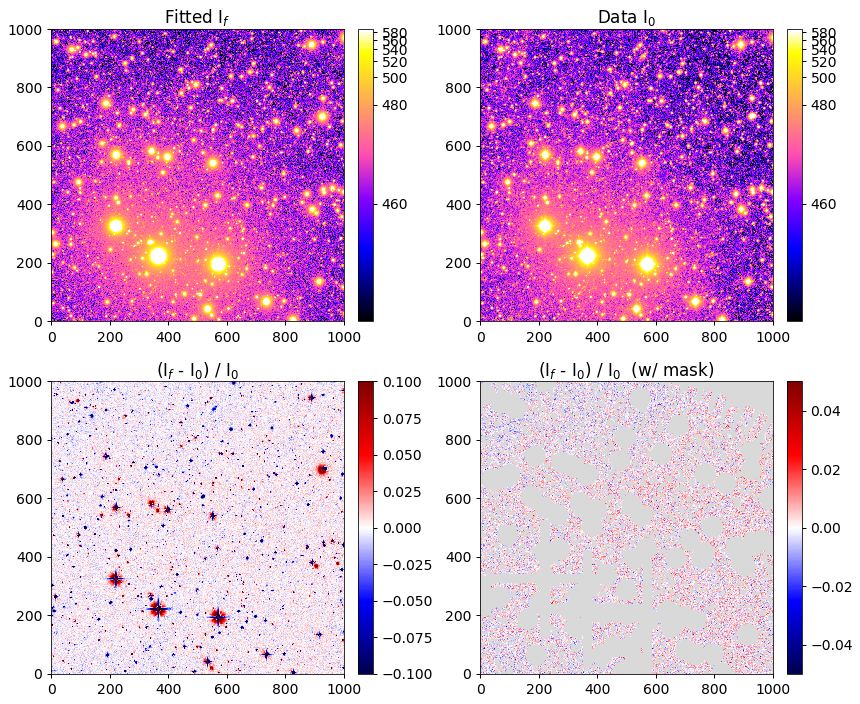

In [25]:
image_fit, noise_fit, pmed = generate_image_fit(ds_3p.results, psf, stars0, image_base)
cal_reduced_chi2(image_fit[~mask_fit].ravel(), Y, pmed, sky_only=True, n_param=7)
draw_comparison_fit_data(image_fit, image, noise_fit, mask_fit, vmin=458, vmax=590)


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 7


iter: 2691 | batch: 2 | bound: 139 | nc: 2 | ncall: 15748 | eff(%): 17.088 | loglstar: -554385.180 < -554379.633 < -554381.820 | logz: -554412.813 +/-  0.925 | stop:  5.079                          



Finish Fitting! Total time elapsed: 2.61e+03 s

Pool Closed.


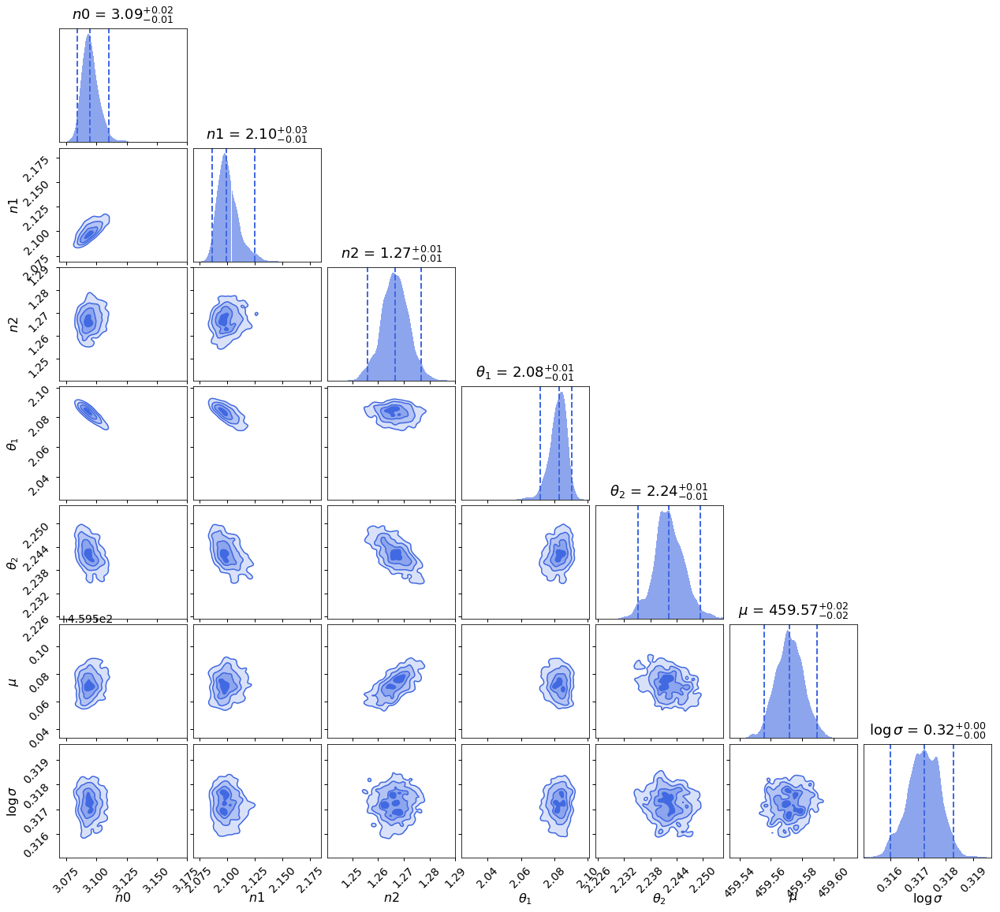

In [89]:
# Run & Plot
############################################
ds_3p = DynamicNestedSampler(loglike_3p, prior_tf_3p, ndim)
ds_3p.run_fitting(nlive_init=70, nlive_batch=15, maxbatch=2)

ds_3p.cornerplot(labels=labels, figsize=(18, 16))

In [ ]:
save_nested_fitting_result(ds_3p.results, filename='./real/NGC5907-G-fit_best_X%dY%d_mask48pix_3PS.res'%(patch_Xmin0, patch_Ymin0))
ds_3p_res = open_nested_fitting_result('./real/NGC5907-G-fit_best_X%dY%d_mask48pix_3PS.res'%(patch_Xmin0, patch_Ymin0))

Fitting (mean) :  [3.09500e+00 2.10100e+00 1.26700e+00 2.08200e+00 2.24200e+00 4.59572e+02
 3.17000e-01]
Fitting (median) :  [3.09400e+00 2.09900e+00 1.26700e+00 2.08300e+00 2.24200e+00 4.59572e+02
 3.17000e-01]


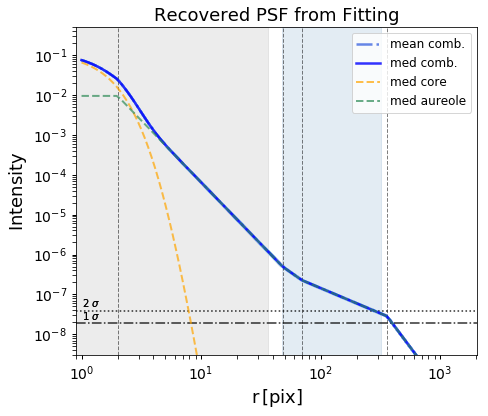

In [100]:
plot_fit_PSF(ds_3p_res, psf, n_bootstrap=1000, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 459.57 +/- 2.08
Reduced Chi^2: 1.03426


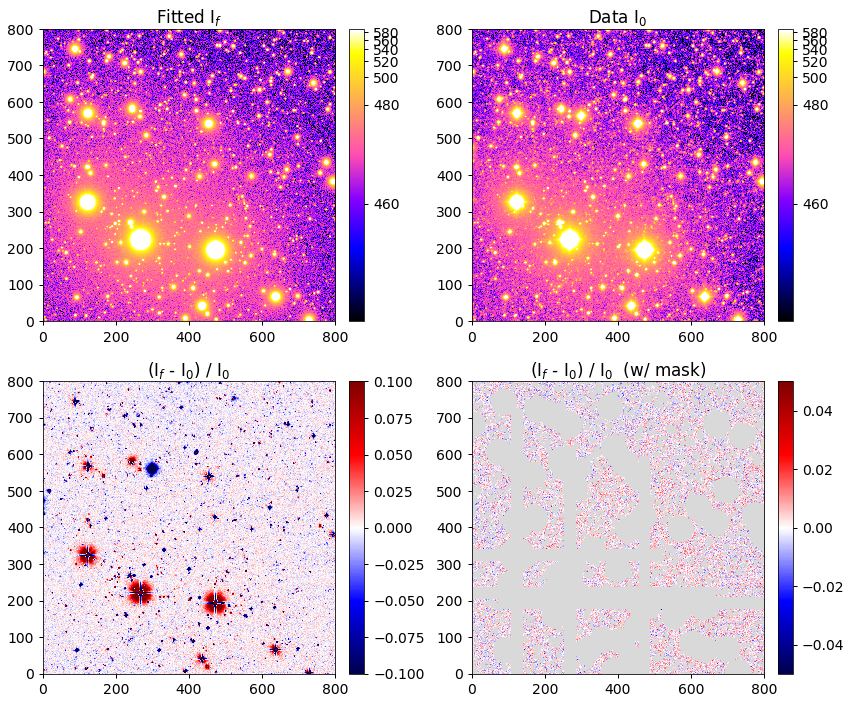

In [101]:
image_fit, noise_fit, pmed = generate_image_fit(ds_3p_res, psf, stars0, image_base)
cal_reduced_chi2(image_fit[~mask_fit].ravel(), Y, pmed, sky_only=True, n_param=7)
draw_comparison_fit_data(image_fit, image, noise_fit, mask_fit, vmin=458, vmax=590)

### Single Power Law

Estimate of Background: (462.317, 2.858)


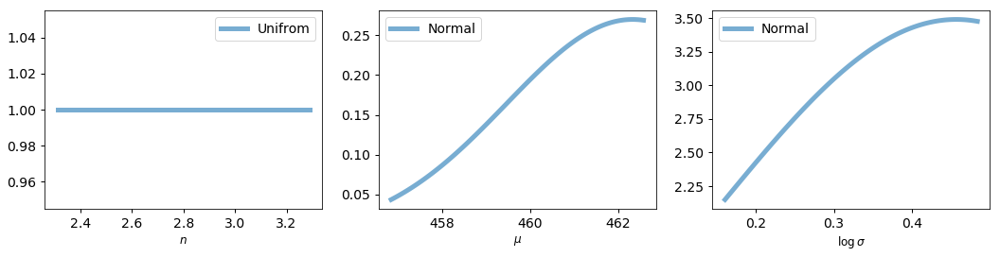

In [102]:
# Priors and Likelihood Models for Fitting
############################################
labels = [r'$n$', r'$\mu$', r'$\log\,\sigma$']
ndim = len(labels)

# Make Priors
prior_tf = set_prior(n_est=2.8, mu_est=mu_patch, std_est=std_patch, method='p',
                     xlabels=labels, plabels=['Unifrom','Normal','Normal'])

def loglike(v):
    _n, _mu = v[:-1]
    _sigma = 10**v[-1]
    
    psf.update({'n':_n})
    
    # I varies with sky background
    stars.z_norm = z_norm_stars + (stars.BKG - _mu)
    
    image_tri = generate_image_by_znorm(psf, stars, psf_range=[320,640], brightest_only=True,
                                        psf_scale=pixel_scale, parallel=False, draw_real=True)
    image_tri = image_tri + image_base + _mu
    
    ypred = image_tri[~mask_fit].ravel()
    residsq = (ypred - Y)**2 / _sigma**2
    loglike = -0.5 * np.sum(residsq + np.log(2 * np.pi * _sigma**2))
    
    if not np.isfinite(loglike):
        loglike = -1e100
        
    return loglike


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 3


iter: 1108 | batch: 2 | bound: 33 | nc: 1 | ncall: 3990 | eff(%): 27.769 | loglstar: -634019.053 < -634016.786 < -634017.693 | logz: -634033.683 +/-  0.784 | stop:  8.489                            



Finish Fitting! Total time elapsed: 790 s

Pool Closed.


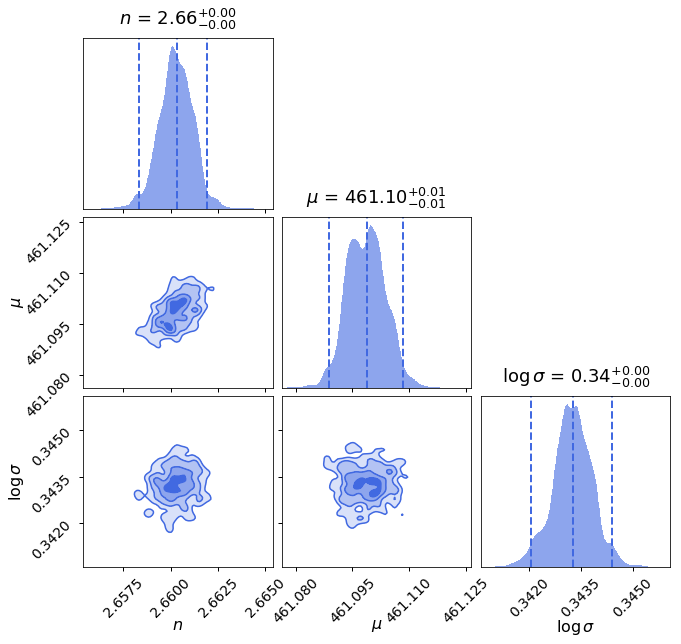

In [104]:
# Run & Plot
############################################
ds = DynamicNestedSampler(loglike, prior_tf, ndim)
ds.run_fitting(nlive_init=50, nlive_batch=15, maxbatch=2)

ds.cornerplot(labels=labels, figsize=(10, 9))

Fitting (mean) :  [2.66000e+00 4.61099e+02 3.43000e-01]
Fitting (median) :  [2.66000e+00 4.61099e+02 3.43000e-01]


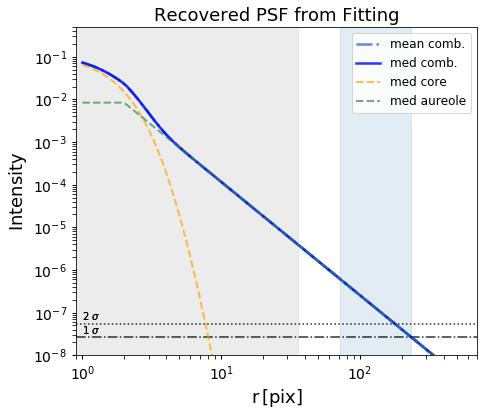

In [119]:
plot_fit_PSF(ds.results, psf, n_bootstrap=1000, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 461.10 +/- 2.20
Reduced Chi^2: 1.03948


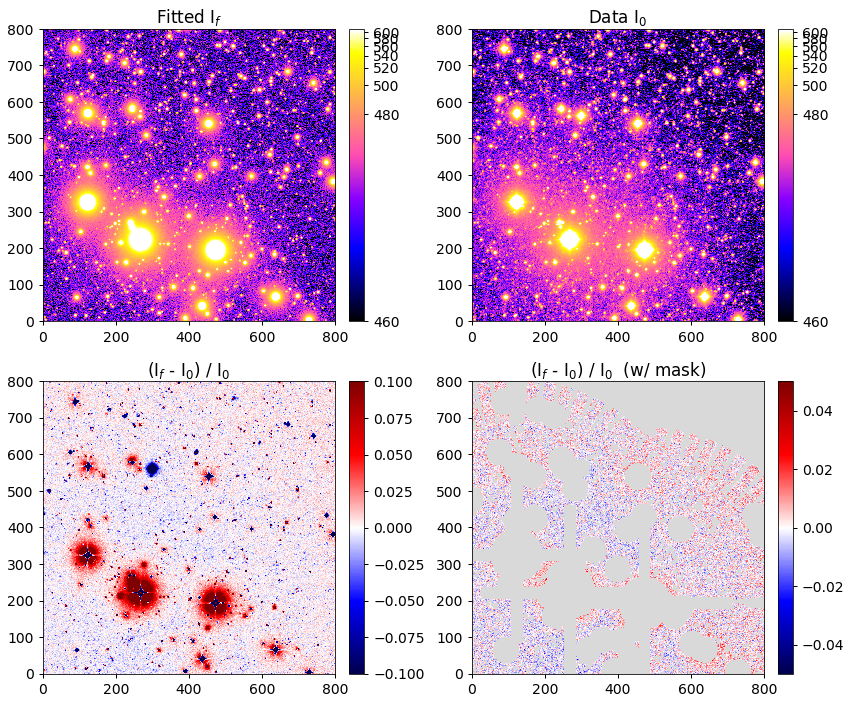

In [122]:
image_fit, noise_fit, pmed = generate_image_fit(ds.results, psf, stars0, image_base)
cal_reduced_chi2(image_fit[~mask_fit].ravel(), Y, sigma=10**pmed[-1], n_param=3)
draw_comparison_fit_data(image_fit, image, noise_fit, mask_fit, vmin=460)

In [124]:
save_nested_fitting_result(ds.results, filename='./real/NGC5907-G-fit_best_X%dY%d_mask72pix.res'%(patch_Xmin0, patch_Ymin0))

Patch 2

Run Nested Fitting for the image... Dim of params: 3
Opening pool: # of CPU used: 3


iter: 2236 | batch: 2 | bound: 29 | nc: 2 | ncall: 7458 | eff(%): 29.981 | loglstar: -959135.099 < -959131.950 < -959133.107 | logz: -959148.227 +/-  0.544 | stop:  4.903                            


Finish Fitting! Total time elapsed: 1.21e+03s


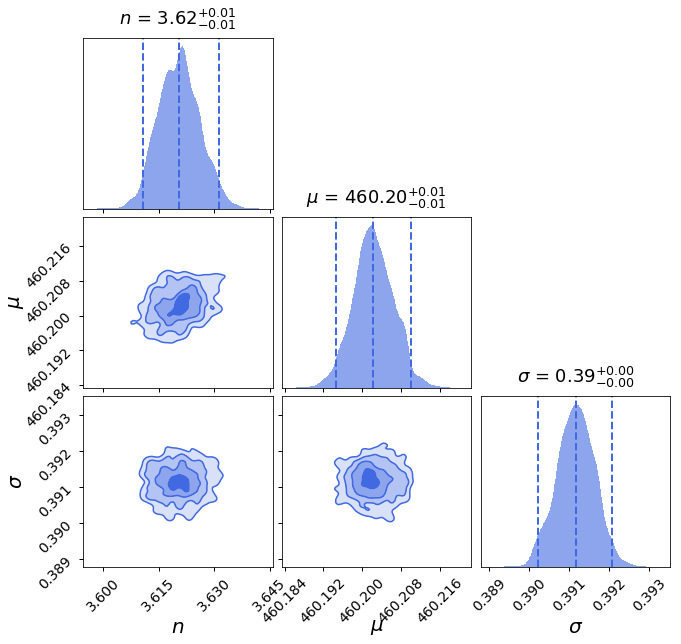

In [43]:
# Run Fitting
pdsampler = Run_Dynamic_Nested_Fitting(loglike, prior_tf, ndim, nlive_init=100, nlive_batch=50)
pdres = pdsampler.results

# Plot Result
fig, axes = dyplot.cornerplot(pdres, labels=labels, 
                              color="royalblue", truth_color="indianred",
                              title_kwargs={'fontsize':18, 'y': 1.04},
                              label_kwargs={'fontsize':20}, show_titles=True, 
                              fig=plt.subplots(ndim, ndim, figsize=(10, 9)))

Bakground : 460.20 +/- 2.46
Reduced Chi^2: 0.99984


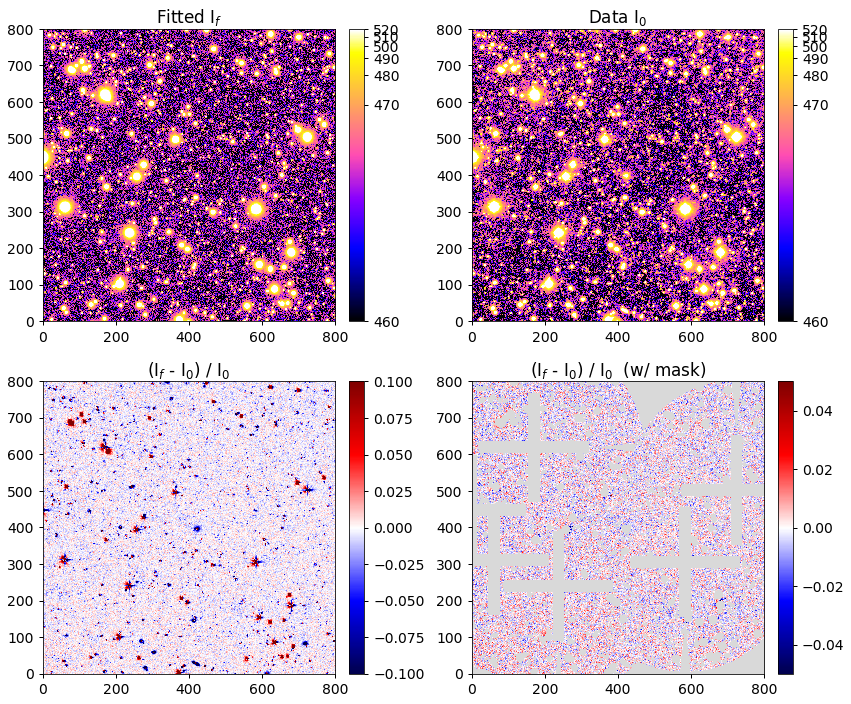

In [44]:
image_fit, noise_fit, pmed = generate_image_fit(pdres, psf, stars0, image_base)
cal_reduced_chi2(image_fit[~mask_fit].ravel(), Y, sigma=10**pmed[-1], n_param=3)
draw_comparison_fit_data(image_fit, image, noise_fit, mask_fit, vmin=460, vmax=520)

In [47]:
save_nested_fitting_result(pdres, filename='./real/NGC5907-G-fit_best_X%dY%d.res'%(patch_Xmin0, patch_Ymin0))

## Historical Results

#### Region: [3100,1400,4100,2400]
#### Fitted patch: 800 X 800  
#### Dual Mask : S/N = 3   +   $\bf R_{core} = 1\,(0.5)\,arcmin$   +   Gaussian Noise

Run Nested Fitting for the image... Dim of paramas: 4
Opening pool: # of CPU used: 3


iter: 3444 | batch: 2 | bound: 800 | nc: 416 | ncall: 134424 | eff(%):  2.562 | loglstar: -654291.984 < -654287.469 < -654290.868 | logz: -654315.495 +/-  0.718 | stop:  4.397                       


Finish Fitting! Total time elapsed: 1.5e+04s


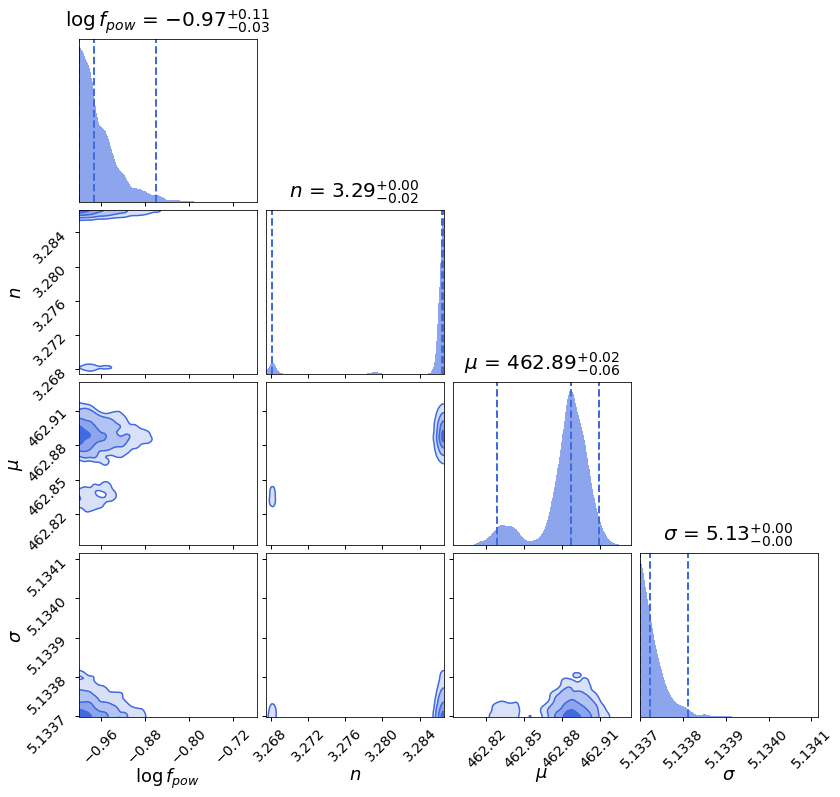

In [171]:
############################################
# Fitting
############################################

if RUN_FITTING:
    start = time.time()
    pdsampler = Run_Dynamic_Nested_Fitting(loglike, prior_tf, ndim=4, 
                                           nlive_init=100, nlive_batch=50, maxbatch=2)
    end = time.time()
    print("Finish Fitting! Total time elapsed: %.3gs"%(end-start))
    
    pdres = pdsampler.results

    # Plot Result
    fig, axes = dyplot.cornerplot(pdres, show_titles=True, 
                                  color="royalblue", 
                                  labels=labels,
                                  title_kwargs={'fontsize':20, 'y': 1.04}, 
                                  label_kwargs={'fontsize':18},
                                  fig=plt.subplots(4, 4, figsize=(12, 11)))

In [172]:
chi2_reduced = cal_reduced_chi2(pdres, Y)

Reduced Chi^2: 0.35933


In [190]:
save_nested_fitting_result(pdres, filename='./NGC5907-G-fit_best_X3100Y1400.res')

Fitting (mean):  [ -1.15175395   2.78499813 461.93239078   2.36513342]
Fitting (median):  [ -1.15553728   2.78501443 461.93224525   2.36520676]
2643214.6874619466 1057.661772445025
2641476.6975351567 1057.694568483241


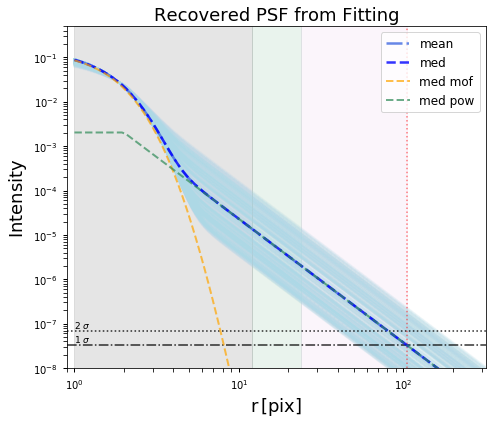

In [42]:
plot_fit_PSF(pdres, n_bootstrap=500, image_size=image_size)

#### Region: [800,800,1800,1800] 
#### Fitted patch: 800 X 800  
#### Dual Mask : S/N = 3   +   $\bf R_{core} = 1\,(0.5)\,arcmin$   +   Gaussian Noise

Run Nested Fitting for the image... Dim of paramas: 4
Opening pool: # of CPU used: 3


iter: 2426 | batch: 2 | bound: 70 | nc: 5 | ncall: 13663 | eff(%): 17.756 | loglstar: -484303.150 < -484300.227 < -484301.503 | logz: -484318.615 +/-  0.576 | stop:  4.146                           


Finish Fitting! Total time elapsed: 1.26e+03s


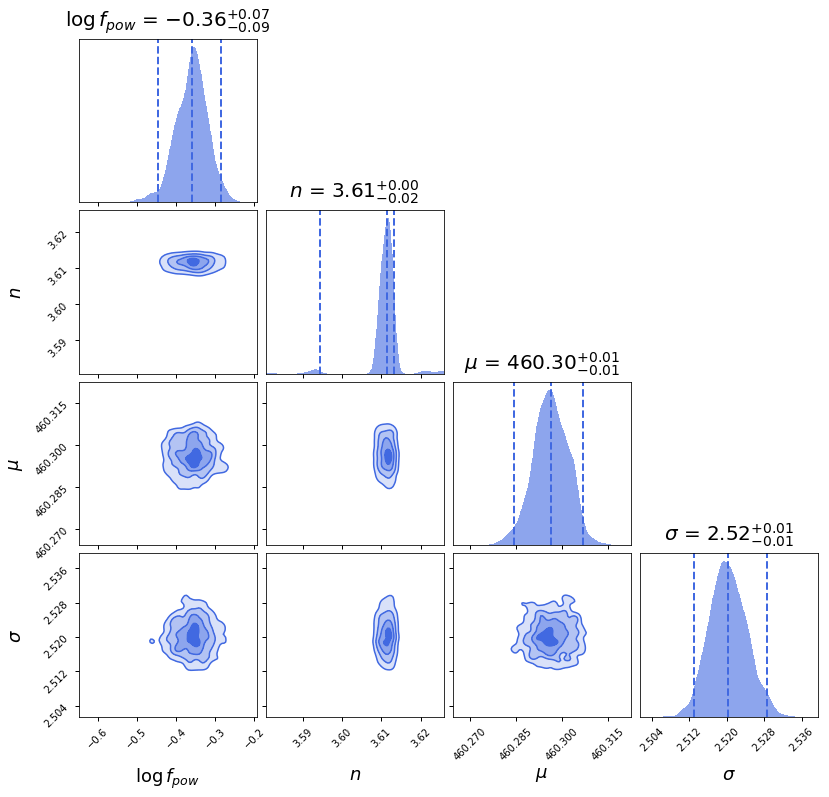

In [30]:
if RUN_FITTING:
    start = time.time()
    pdsampler = Run_Dynamic_Nested_Fitting(loglike, prior_tf, ndim=4, 
                                           nlive_init=100, nlive_batch=50, maxbatch=2)
    end = time.time()
    print("Finish Fitting! Total time elapsed: %.3gs"%(end-start))
    
    pdres = pdsampler.results

    # Plot Result
    fig, axes = dyplot.cornerplot(pdres, show_titles=True, 
                                  color="royalblue", 
                                  labels=labels,
                                  title_kwargs={'fontsize':20, 'y': 1.04}, 
                                  label_kwargs={'fontsize':18},
                                  fig=plt.subplots(4, 4, figsize=(12, 11)))

In [225]:
chi2_reduced = cal_reduced_chi2(pdres, Y)

Reduced Chi^2: 1.00189


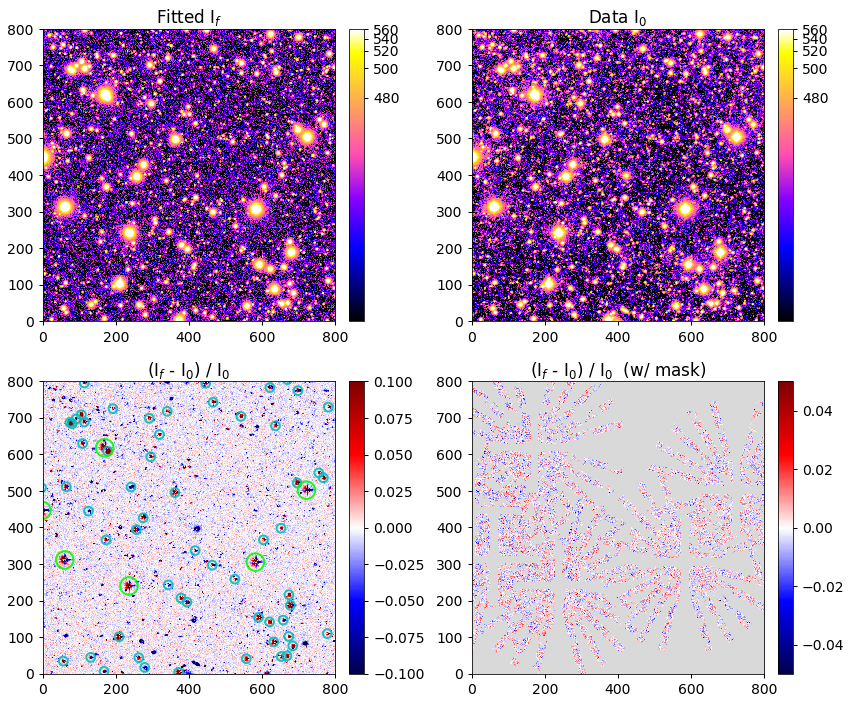

In [230]:
# Difference between real vs conv
pmed, pmean, pcov = get_params_fit(pdres)
logf_fit, n_fit, mu_fit, sigma_fit = pmed

img_fit = generate_image_galsim_scale(frac=10**logf_fit, n=n_fit, mu=mu_fit, 
                                      star_pos=star_pos, scale=z_norm, parallel=True, draw_real = True)
noise_fit = make_noise_image(image_size, sigma_fit**2)
img_fit += noise_fit

fig, ((ax1,ax2), (ax3,ax4)) = plt.subplots(2,2,figsize=(12,10))
im = ax1.imshow(img_fit, vmin=mu_fit, vmax=mu+100, norm=norm1, cmap="gnuplot2")
colorbar(im)
im = ax2.imshow(image, vmin=mu_fit, vmax=mu+100, norm=norm1, cmap="gnuplot2")    
colorbar(im)
diff = (img_fit-image)/image
im = ax3.imshow(diff, vmin=-0.1, vmax=0.1, cmap="seismic")
diff = (img_fit-image)/image
colorbar(im)
aper1.plot(color='c',lw=2,alpha=0.9,axes=ax3)
aper2.plot(color='lime',lw=2,alpha=0.9,axes=ax3)

diff[mask_fit] = np.nan
im = ax4.imshow(diff, vmin=-0.05, vmax=0.05, cmap="seismic")
colorbar(im)

ax1.set_title("Fitted I$_f$")
ax2.set_title("Data I$_0$")
ax3.set_title("(I$_f$ - I$_0$) / I$_0$")
ax4.set_title("(I$_f$ - I$_0$) / I$_0$  (w/ mask)")

plt.tight_layout()


In [234]:
save_nested_fitting_result(pdres, filename='./NGC5907-G-fit_best_X%dY%d.res'%(patch_Xmin0, patch_Ymin0))